# Week 6 Group 5 - Interpreting t-SNE & UMAP
Aria Alinejad, Aleksei Berdiuzhenko, Simen Dymbe, Amanda Ledell, Cameron Louis Penne and Nicole Quattrini

_October 2nd 2024_

# Background
- Non-linear DR technqiues
  - t-SNE
  - UMAP
- **Purpose**: optimize low dimensional representation of data to be similar to the high dimensional representation of the data

### **Background: Non-linear Dimensionality Reduction (DR)**

---

#### **Non-linear DR technqiues**:
- **t-SNE** – *T-distributed Stochastic Neighbor Embedding*
- **UMAP** – *Uniform Manifold Approximation and Projection*

---

#### **Purpose**:
To optimize **low-dimensional representation** of data, ensuring it reflects the **structure** and **relationships** from the **high-dimensional** space.

<div style="text-align: left;">
  <h1>Global vs Local Structures:</h1>
  <p>
    <strong>Global structure</strong>: Overall arrangement of data across the entire dataset in the high dimensional space
  </p>
  <p>
    <strong>Local structure</strong>: Arrangement of nearby points across a portion of the dataset in the high dimensional space
  </p>
</div>

<!-- Separate div to center the image -->
<div style="width: 900px; margin:auto; ">
  <img src="mamut.png" alt="Image description" style="width: 900px;">
</div>


<div style="text-align: left;">
  <h1>Parameters and Structures</h1>
  <p>
    - Local structures are preserved after t-SNE or UMAP as the clusters
  </p>
  <p>
    - Perplexity (t-SNE) and number of neighbors (UMAP) impact preservation of global structure
  </p>
</div>

<!-- Separate div to center the image -->
<div style="width: 1100px; margin: auto;">
  <img src="bird.png" alt="Bird image" style="width: 1100px;">
</div>


# IRIS dataset
## Project data into 2D and 3D with t-SNE

In [1]:
from sklearn.manifold import TSNE
import plotly.express as px
from plotly.subplots import make_subplots

# Load dataset
df = px.data.iris()
features = df.loc[:, :'petal_width']

# Perform t-SNE with 2D and 3D projections
tsne_2d = TSNE(n_components=2, random_state=42)
projections_2d = tsne_2d.fit_transform(features)

tsne_3d = TSNE(n_components=3, random_state=42)
projections_3d = tsne_3d.fit_transform(features)

# Create subplots for t-SNE with 1 row and 2 columns
fig_tsne = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter'}, {'type': 'scatter3d'}]],
    subplot_titles=('t-SNE 2D Scatter Plot', 't-SNE 3D Scatter Plot')
)

# Create the 2D scatter plot for t-SNE
fig_2d_tsne = px.scatter(
    projections_2d, x=0, y=1,
    color=df.species, labels={'color': 'species'}
)

# Add the 2D scatter plot to the first subplot for t-SNE, with legend disabled
for trace in fig_2d_tsne['data']:
    trace['showlegend'] = False  # Disable legend for t-SNE plot
    fig_tsne.add_trace(trace, row=1, col=1)

# Create the 3D scatter plot for t-SNE
fig_3d_tsne = px.scatter_3d(
    projections_3d, x=0, y=1, z=2,
    color=df.species, labels={'color': 'species'}
)
fig_3d_tsne.update_traces(marker_size=8)

# Add the 3D scatter plot to the second subplot for t-SNE, with legend disabled
for trace in fig_3d_tsne['data']:
    fig_tsne.add_trace(trace, row=1, col=2)

# Update layout for the t-SNE plot
fig_tsne.update_layout(height=600, width=1200)

# Show the t-SNE plot without legend
fig_tsne.show()


In [2]:
fig_tsne.show()

# IRIS dataset
## Project data into 2D and 3D with UMAP

In [3]:
from umap import UMAP
import plotly.express as px
from plotly.subplots import make_subplots

# Load dataset
df = px.data.iris()
features = df.loc[:, :'petal_width']

# Perform UMAP with 2D and 3D projections
umap_2d = UMAP(n_components=2, init='random', random_state=42)
umap_3d = UMAP(n_components=3, init='random', random_state=42)

proj_2d = umap_2d.fit_transform(features)
proj_3d = umap_3d.fit_transform(features)

# Create subplots for UMAP with 1 row and 2 columns
fig_umap = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter'}, {'type': 'scatter3d'}]],
    subplot_titles=('UMAP 2D Scatter Plot', 'UMAP 3D Scatter Plot')
)

# Create the 2D scatter plot for UMAP
fig_2d_umap = px.scatter(
    proj_2d, x=0, y=1,
    color=df.species, labels={'color': 'species'}
)

# Add the 2D scatter plot to the first subplot for UMAP
for trace in fig_2d_umap['data']:
    trace['showlegend'] = False  # Disable legend for t-SNE plot
    fig_umap.add_trace(trace, row=1, col=1)

# Create the 3D scatter plot for UMAP
fig_3d_umap = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=df.species, labels={'color': 'species'}
)
fig_3d_umap.update_traces(marker_size=8)

# Add the 3D scatter plot to the second subplot for UMAP
for trace in fig_3d_umap['data']:
    fig_umap.add_trace(trace, row=1, col=2)

# Update layout for the UMAP plot
fig_umap.update_layout(height=600, width=1200)

# Show the UMAP plot
fig_umap.show()


/opt/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/opt/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [4]:
fig_umap.show()

### **Vowel Dataset**

- **Dataset**: Norwegian vowel sounds
  - Vowels included:
    - **i**
    - **y**
    - **e**
  
- **Data source**: Extracted from spoken segments within sentences
  
- **Diverse speakers**: Data collected from various speakers for robustness


In [ ]:
!pip install umap-learn
!unzip assignment3.zip

from transformers import HubertModel, WavLMModel, Wav2Vec2Model
import matplotlib.pyplot as plt
import pickle
import torch
import numpy as np
import pandas as pd
import scipy.io.wavfile as wav
from librosa.feature import mfcc
from librosa import resample
from umap import UMAP
from sklearn.manifold import TSNE
import os

print(os.listdir("."))

%matplotlib inline

plotting_colors = {
    "i": "tab:blue",
    "y": "tab:orange",
    "e": "tab:green"
}


def get_middle(array, length):
    if len(array) < length: # Zero-pad at end if to short
        return np.pad(array, (0, length - len(array)))

    start = (len(array) - length) // 2
    end = start + length

    return array[start:end]

def load_audio(filename, middle=True, middle_length=512, resample_waveform=True):
    rate, waveform = wav.read("assignment3//" + filename)
    print()

    waveform = waveform / 32767

    if resample_waveform:
        waveform = resample(waveform, orig_sr=rate, target_sr=16000)

    if middle:
        waveform = get_middle(waveform, middle_length)

    return waveform

  # open a file
test_file = open('assignment3//test.pkl', 'rb')
train_file = open('assignment3//train.pkl', 'rb')

# load pickled Pandas.DataFrame
test_data = pickle.load(test_file)
train_data = pickle.load(train_file)

# Split data into three vowels
test_i_mask = np.where(test_data["label"] == "i")
test_y_mask = np.where(test_data["label"] == "y")
test_e_mask = np.where(test_data["label"] == "e")
train_i_mask = np.where(train_data["label"] == "i")
train_y_mask = np.where(train_data["label"] == "y")
train_e_mask = np.where(train_data["label"] == "e")

X_train_raw = np.asarray([load_audio(audio_file) for audio_file in train_data["audio_file"]])
X_train_raw = ( X_train_raw - X_train_raw.mean(axis=0))

X_test_raw = np.asarray([load_audio(audio_file) for audio_file in test_data["audio_file"]])
X_test_raw = ( X_test_raw - X_test_raw.mean(axis=0))


# Use transform data into Mel-frequency cepstrum coefficient
X_train_mfcc = np.squeeze(mfcc(y=X_train_raw, sr=48000, n_mfcc=13, dct_type=2, hop_length=2048, n_fft=1024))
X_train_mfcc = ( X_train_mfcc - X_train_mfcc.mean(axis=0)) / X_train_mfcc.std(axis=0)

X_test_mfcc = np.squeeze(mfcc(y=X_test_raw, sr=48000, n_mfcc=13, dct_type=2, hop_length=2048, n_fft=1024))
X_test_mfcc = ( X_test_mfcc - X_test_mfcc.mean(axis=0)) / X_test_mfcc.std(axis=0)

print("Test data", X_test_mfcc.shape)
print("Train data", X_train_mfcc.shape)

i_raw_example = X_test_raw[test_i_mask][0]
y_raw_example = X_test_raw[test_y_mask][0]
e_raw_example = X_test_raw[test_e_mask][0]

Archive:  assignment3.zip
  inflating: assignment3/.DS_Store   
   creating: assignment3/audio/
  inflating: assignment3/audio/.DS_Store  
   creating: assignment3/audio/test/
  inflating: assignment3/audio/test/p1_g01_f1_3_t-c1191_6499_6603.wav  
  inflating: assignment3/audio/test/p1_g01_f1_3_t-c1524_4922_5030.wav  
  inflating: assignment3/audio/test/p1_g01_f1_4_x-b0381_4925_5058.wav  
  inflating: assignment3/audio/test/p1_g01_f1_5_x-b0016_4370_4520.wav  
  inflating: assignment3/audio/test/p1_g01_f1_5_x-b0171_4055_4182.wav  
  inflating: assignment3/audio/test/p1_g01_f1_5_x-b0544_2828_2952.wav  
  inflating: assignment3/audio/test/p1_g01_f2_1_t-b0267_7485_7598.wav  
  inflating: assignment3/audio/test/p1_g01_f2_1_t-c1068_3903_4005.wav  
  inflating: assignment3/audio/test/p1_g01_f2_1_t-c1870_2545_2622.wav  
  inflating: assignment3/audio/test/p1_g01_f2_3_t-b0473_3913_4060.wav  
  inflating: assignment3/audio/test/p1_g01_f2_3_t-c1554_2764_2898.wav  
  inflating: assignment3/audio/t

/usr/local/lib/python3.10/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=1024 is too large for input signal of length=512
  warnings.warn(


Test data (300, 13)
Train data (750, 13)


## Raw data and MFCC

In [ ]:
n_components = 2
umap_n_neighbors = 15

umap_raw = UMAP(n_neighbors=umap_n_neighbors)
raw_umap = umap_raw.fit_transform(X_train_raw)

umap_mfcc = UMAP(n_neighbors=umap_n_neighbors)
mfcc_umap = umap_mfcc.fit_transform(X_train_mfcc)

tsne_perplexity = 30
tsne_max_iter = 1000

tsne_raw = TSNE(perplexity=tsne_perplexity, max_iter=tsne_max_iter)
raw_tsne = tsne_raw.fit_transform(X_train_raw)

tsne_mfcc = TSNE(perplexity=tsne_perplexity, max_iter=tsne_max_iter)
mfcc_tsne = tsne_mfcc.fit_transform(X_train_mfcc)

In [ ]:
fig, axes = plt.subplots(2, 2)
fig.set_figwidth(9)
fig.set_figheight(9)
fig.suptitle("", fontsize=20)

axes[0, 0].set_title("Raw UMAP")
axes[0, 0].scatter(raw_umap[train_i_mask][:, 0], raw_umap[train_i_mask][:, 1], color=plotting_colors["i"], label="i")
axes[0, 0].scatter(raw_umap[train_y_mask][:, 0], raw_umap[train_y_mask][:, 1], color=plotting_colors["y"], label="y")
axes[0, 0].scatter(raw_umap[train_e_mask][:, 0], raw_umap[train_e_mask][:, 1], color=plotting_colors["e"], label="e")

axes[0, 1].set_title("MFCC UMAP")
axes[0, 1].scatter(mfcc_umap[train_i_mask][:, 0], mfcc_umap[train_i_mask][:, 1], color=plotting_colors["i"], label="i")
axes[0, 1].scatter(mfcc_umap[train_y_mask][:, 0], mfcc_umap[train_y_mask][:, 1], color=plotting_colors["y"], label="y")
axes[0, 1].scatter(mfcc_umap[train_e_mask][:, 0], mfcc_umap[train_e_mask][:, 1], color=plotting_colors["e"], label="e")

axes[1, 0].set_title("Raw t-SNE")
axes[1, 0].scatter(raw_umap[train_i_mask][:, 0], raw_umap[train_i_mask][:, 1], color=plotting_colors["i"], label="i")
axes[1, 0].scatter(raw_umap[train_y_mask][:, 0], raw_umap[train_y_mask][:, 1], color=plotting_colors["y"], label="y")
axes[1, 0].scatter(raw_umap[train_e_mask][:, 0], raw_umap[train_e_mask][:, 1], color=plotting_colors["e"], label="e")

axes[1, 1].set_title("MFCC t-SNE")
axes[1, 1].scatter(mfcc_tsne[train_i_mask][:, 0], mfcc_tsne[train_i_mask][:, 1], color=plotting_colors["i"], label="i")
axes[1, 1].scatter(mfcc_tsne[train_y_mask][:, 0], mfcc_tsne[train_y_mask][:, 1], color=plotting_colors["y"], label="y")
axes[1, 1].scatter(mfcc_tsne[train_e_mask][:, 0], mfcc_tsne[train_e_mask][:, 1], color=plotting_colors["e"], label="e")

axes[0, 0].legend()
axes[0, 1].legend()
axes[1, 0].legend()
axes[1, 1].legend()


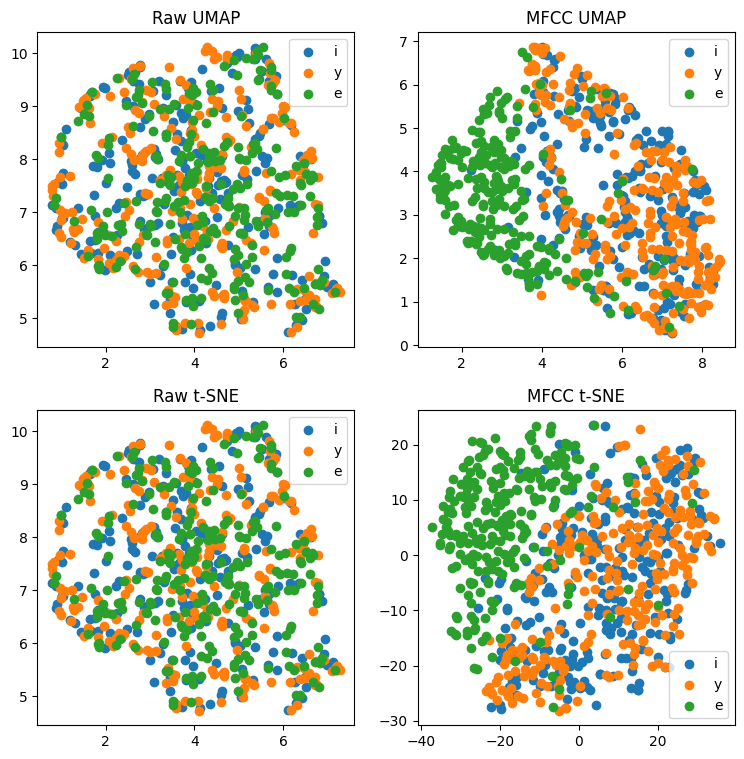

In [ ]:
plt.show()

In [ ]:
import numpy as np
import torch

model_english = Wav2Vec2Model.from_pretrained("facebook/wav2vec2-large-960h")
model_norwegian = Wav2Vec2Model.from_pretrained("NbAiLab/nb-wav2vec2-300m-bokmaal-v2")

audio = torch.FloatTensor(X_train_raw)
print(audio.shape)

# Extract features
features_english = model_english(audio).last_hidden_state.squeeze()
features_norwegian = model_norwegian(audio).last_hidden_state.squeeze()

print(features_english.shape)
print(features_norwegian.shape)

Some weights of Wav2Vec2Model were not initialized from the model checkpoint at facebook/wav2vec2-large-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1', 'wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


config.json:   0%|          | 0.00/2.28k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.26G [00:00<?, ?B/s]

Some weights of Wav2Vec2Model were not initialized from the model checkpoint at NbAiLab/nb-wav2vec2-300m-bokmaal-v2 and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


torch.Size([750, 512])
torch.Size([750, 1024])
torch.Size([750, 1024])


## Wav2Vec 2.0

In [ ]:
n_components = 2

umap_n_neighbors = 15

umap_features_english = UMAP(n_neighbors=umap_n_neighbors)
features_english_umap = umap_mfcc.fit_transform(features_english.cpu().detach().numpy())

umap_features_norwegian = UMAP(n_neighbors=umap_n_neighbors)
features_norwegian_umap = umap_mfcc.fit_transform(features_norwegian.cpu().detach().numpy())

tsne_perplexity = 30
tsne_max_iter = 10000

tsne_features_english = TSNE(perplexity=tsne_perplexity, max_iter=tsne_max_iter)
features_english_tsne = tsne_features_english.fit_transform(features_english.cpu().detach().numpy())

tsne_features_norwegian = TSNE(perplexity=tsne_perplexity, max_iter=tsne_max_iter)
features_norwegian_tsne = tsne_features_norwegian.fit_transform(features_norwegian.cpu().detach().numpy())

In [ ]:
fig, axes = plt.subplots(2, 2)
fig.set_figwidth(9)
fig.set_figheight(9)
fig.suptitle("", fontsize=20)

axes[0, 0].set_title("UMAP Features from\n Wav2Vec2 (english)")
axes[0, 0].scatter(features_english_umap[train_i_mask][:, 0], features_english_umap[train_i_mask][:, 1], color=plotting_colors["i"], label="i")
axes[0, 0].scatter(features_english_umap[train_y_mask][:, 0], features_english_umap[train_y_mask][:, 1], color=plotting_colors["y"], label="y")
axes[0, 0].scatter(features_english_umap[train_e_mask][:, 0], features_english_umap[train_e_mask][:, 1], color=plotting_colors["e"], label="e")

axes[0, 1].set_title("UMAP Features from\n Wav2Vec2 (norwegian finetuned)")
axes[0, 1].scatter(features_norwegian_umap[train_i_mask][:, 0], features_norwegian_umap[train_i_mask][:, 1], color=plotting_colors["i"], label="i")
axes[0, 1].scatter(features_norwegian_umap[train_y_mask][:, 0], features_norwegian_umap[train_y_mask][:, 1], color=plotting_colors["y"], label="y")
axes[0, 1].scatter(features_norwegian_umap[train_e_mask][:, 0], features_norwegian_umap[train_e_mask][:, 1], color=plotting_colors["e"], label="e")

axes[1, 0].set_title("t-SNE Features from\n Wav2Vec2 (english)")
axes[1, 0].scatter(features_english_tsne[train_i_mask][:, 0], features_english_tsne[train_i_mask][:, 1], color=plotting_colors["i"], label="i")
axes[1, 0].scatter(features_english_tsne[train_y_mask][:, 0], features_english_tsne[train_y_mask][:, 1], color=plotting_colors["y"], label="y")
axes[1, 0].scatter(features_english_tsne[train_e_mask][:, 0], features_english_tsne[train_e_mask][:, 1], color=plotting_colors["e"], label="e")

axes[1, 1].set_title("t-SNE Features from\n Wav2Vec2 (norwegian finetuned)")
axes[1, 1].scatter(features_norwegian_tsne[train_i_mask][:, 0], features_norwegian_tsne[train_i_mask][:, 1], color=plotting_colors["i"], label="i")
axes[1, 1].scatter(features_norwegian_tsne[train_y_mask][:, 0], features_norwegian_tsne[train_y_mask][:, 1], color=plotting_colors["y"], label="y")
axes[1, 1].scatter(features_norwegian_tsne[train_e_mask][:, 0], features_norwegian_tsne[train_e_mask][:, 1], color=plotting_colors["e"], label="e")

axes[0, 0].legend()
axes[0, 1].legend()
axes[1, 0].legend()
axes[1, 1].legend()
plt.tight_layout()

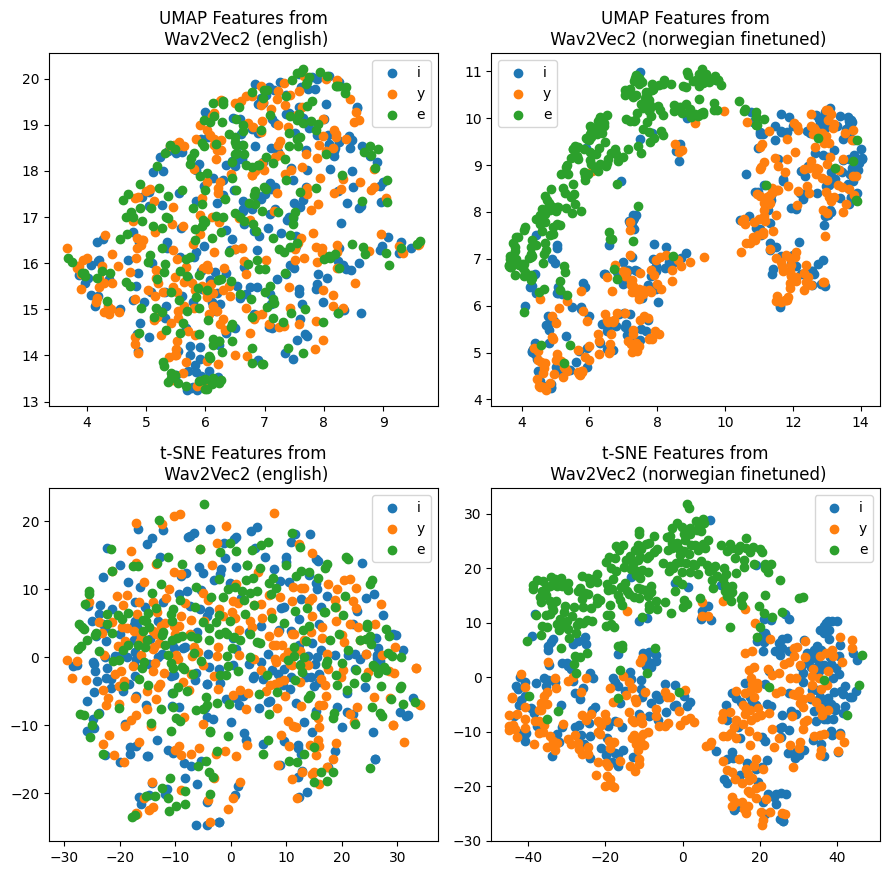

In [ ]:
  plt.show()

<div style="display: flex; justify-content: space-between; align-items: center; height: 100%;">
  <!-- Left side for text -->
  <div style="width: 60%; text-align: left;">
    <h1>MNIST Fashion dataset</h1>
    <ul>
      <li>28x28 size grayscale images</li>
      <li>10 classes
        <ul>
          <li>T-shirt/top</li>
          <li>Trouser</li9
          <li>Pullover</li>
          <li>Dress</li>
          <li>Coat</li>
          <li>Sandal</li>
          <li>Shirt</li>
          <li>Sneaker</li>
          <li>Bag</li>
          <li>Ankle boot</li>
        </ul>
      </li>
      <li>We use 5000 samples</li>
      <li>t-SNE is run with perplexity=30</li>
      <li>UMAP is run with n_neighbors=15, min_dist=0.1</li>
    </ul>
  </div>
  
  <!-- Right side for image placeholder -->
  <div style="width: 35%; margin-top: 250px ">
    <h1><img src="fashion.png" alt="Fashion dataset" style="width: 800px"; /></h1>
  </div>
</div>


In [1]:
# Import necessary libraries
!pip install umap-learn
import torch
from torchvision import datasets, transforms
import umap
import plotly.express as px
from tqdm import tqdm  # For progress bar
import pandas as pd

# Mapping Fashion MNIST labels to clothing types and defining marker symbols
label_mapping = {
    0: 'T-shirt/top', 1: 'Trouser', 2: 'Pullover', 3: 'Dress', 4: 'Coat',
    5: 'Sandal', 6: 'Shirt', 7: 'Sneaker', 8: 'Bag', 9: 'Ankle boot'
}

# Define a set of distinct marker symbols
marker_symbols = ['circle', 'square', 'diamond', 'cross', 'x',
                  'triangle-up', 'triangle-down', 'triangle-left', 'triangle-right', 'pentagon']

# Load Fashion MNIST using PyTorch
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])
fashion_mnist_data = datasets.FashionMNIST(root='./data', train=True, download=True, transform=transform)

# Convert data to numpy arrays
images = fashion_mnist_data.data.numpy() / 255.0
labels = fashion_mnist_data.targets.numpy()

# Flatten the images for UMAP
images_flat = images.reshape(images.shape[0], -1)

# Take a subset of the data (for quicker computation)
n_samples = 5000
subset_images = images_flat[:n_samples]
subset_labels = labels[:n_samples]

## Train UMAP

In [6]:
# Apply UMAP for 2D and 3D
umap_2d = umap.UMAP(n_components=2, random_state=42) # n_neighbors=15, min_dist=0.1
umap_3d = umap.UMAP(n_components=3, random_state=42)

# Perform UMAP embeddings with tqdm progress bars
with tqdm(total=n_samples, desc="UMAP 2D embedding") as pbar:
    umap_2d_embeddings = umap_2d.fit_transform(subset_images)
    pbar.update(n_samples)

with tqdm(total=n_samples, desc="UMAP 3D embedding") as pbar:
    umap_3d_embeddings = umap_3d.fit_transform(subset_images)
    pbar.update(n_samples)

# Create DataFrames for UMAP embeddings
umap_2d_df = pd.DataFrame(umap_2d_embeddings, columns=['x', 'y'])
umap_3d_df = pd.DataFrame(umap_3d_embeddings, columns=['x', 'y', 'z'])

# Add labels and symbols to the DataFrames
for df in [umap_2d_df, umap_3d_df]:
    df['label'] = subset_labels
    df['clothing_type'] = df['label'].map(label_mapping)
    df['symbol'] = df['label'].map(dict(zip(label_mapping.keys(), marker_symbols)))

# Visualize UMAP 2D
fig_2d = px.scatter(umap_2d_df, x='x', y='y', color='clothing_type', symbol='symbol', title="UMAP 2D Fashion MNIST")
fig_2d.show()

# Visualize UMAP 3D
fig_3d = px.scatter_3d(umap_3d_df, x='x', y='y', z='z', color='clothing_type', symbol='symbol', title="UMAP 3D Fashion MNIST")
fig_3d.show()


UMAP 2D embedding:   0%|                               | 0/5000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

UMAP 3D embedding:   0%|                               | 0/5000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

UMAP 3D embedding: 100%|███████████████████| 5000/5000 [00:07<00:00, 669.05it/s]


## Train t-SNE

In [3]:
# Import necessary libraries for t-SNE
from sklearn.manifold import TSNE
from tqdm import tqdm  # For progress bar
import plotly.express as px
import pandas as pd

# Number of samples (replace with your variable)
n_samples = len(subset_images)

# Apply t-SNE for 2D and 3D (with single thread using n_jobs=1)
tsne_2d = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000, n_jobs=1, method='exact')
tsne_3d = TSNE(n_components=3, random_state=42, perplexity=30, n_iter=1000, n_jobs=1, method='exact')

# Perform t-SNE embeddings with tqdm progress bar for both 2D and 3D
with tqdm(total=n_samples, desc="t-SNE 2D and 3D embeddings") as pbar:
    tsne_2d_embeddings = tsne_2d.fit_transform(subset_images)
    tsne_3d_embeddings = tsne_3d.fit_transform(subset_images)
    pbar.update(n_samples)

# Create DataFrames for t-SNE embeddings
tsne_2d_df = pd.DataFrame(tsne_2d_embeddings, columns=['x', 'y'])
tsne_3d_df = pd.DataFrame(tsne_3d_embeddings, columns=['x', 'y', 'z'])

# Add labels and symbols to the DataFrames
for df in [tsne_2d_df, tsne_3d_df]:
    df['label'] = subset_labels
    df['clothing_type'] = df['label'].map(label_mapping)
    df['symbol'] = df['label'].map(dict(zip(label_mapping.keys(), marker_symbols)))

# Visualize t-SNE 2D
fig_2d_tsne = px.scatter(tsne_2d_df, x='x', y='y', color='clothing_type', symbol='symbol', title="t-SNE 2D Fashion MNIST")
fig_2d_tsne.show()

# Visualize t-SNE 3D
fig_3d_tsne = px.scatter_3d(tsne_3d_df, x='x', y='y', z='z', color='clothing_type', symbol='symbol', title="t-SNE 3D Fashion MNIST")
fig_3d_tsne.show()


t-SNE 2D and 3D embeddings:   0%|                      | 0/5000 [00:00<?, ?it/s]/opt/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

/opt/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

t-SNE 2D and 3D embeddings: 100%|███████████| 5000/5000 [18:00<00:00,  4.63it/s]


In [14]:
from plotly.subplots import make_subplots
import plotly.express as px

# 2D Plots
fig_2d = make_subplots(rows=1, cols=2, subplot_titles=('t-SNE 2D', 'UMAP 2D'))  # Swapped titles

# UMAP 2D plot
umap_2d_fig = px.scatter(umap_2d_df, x='x', y='y', color='clothing_type', symbol='symbol',
                         labels={'color': 'Clothing Type'}, title='UMAP 2D',
                         color_discrete_sequence=px.colors.qualitative.Safe)

# Remove symbol name from legend for UMAP 2D
for trace in umap_2d_fig.data:
    trace.showlegend = True
    trace.name = trace.name.split(",")[0]  # Remove the symbol name from the legend

# t-SNE 2D plot
tsne_2d_fig = px.scatter(tsne_2d_df, x='x', y='y', color='clothing_type', symbol='symbol',
                         labels={'color': 'Clothing Type'}, title='t-SNE 2D',
                         color_discrete_sequence=px.colors.qualitative.Safe)

# Remove symbol name from legend for t-SNE 2D
for trace in tsne_2d_fig.data:
    trace.showlegend = False
    trace.name = trace.name.split(",")[0]  # Remove the symbol name from the legend

# Add 2D plots to subplot figure (t-SNE first, UMAP second)
for trace in tsne_2d_fig['data']:
    fig_2d.add_trace(trace, row=1, col=1)

for trace in umap_2d_fig['data']:
    fig_2d.add_trace(trace, row=1, col=2)

# 3D Plots
fig_3d = make_subplots(rows=1, cols=2, specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
                       subplot_titles=('t-SNE 3D', 'UMAP 3D'))  # Swapped titles

# UMAP 3D plot
umap_3d_fig = px.scatter_3d(umap_3d_df, x='x', y='y', z='z', color='clothing_type', symbol='symbol',
                            labels={'color': 'Clothing Type'}, title='UMAP 3D',
                            color_discrete_sequence=px.colors.qualitative.Safe)

# Remove symbol name from legend for UMAP 3D
for trace in umap_3d_fig.data:
    trace.showlegend = True
    trace.name = trace.name.split(",")[0]  # Remove the symbol name from the legend

# t-SNE 3D plot
tsne_3d_fig = px.scatter_3d(tsne_3d_df, x='x', y='y', z='z', color='clothing_type', symbol='symbol',
                            labels={'color': 'Clothing Type'}, title='t-SNE 3D',
                            color_discrete_sequence=px.colors.qualitative.Safe)

# Remove symbol name from legend for t-SNE 3D
for trace in tsne_3d_fig.data:
    trace.showlegend = False
    trace.name = trace.name.split(",")[0]  # Remove the symbol name from the legend

# Add 3D plots to subplot figure (t-SNE first, UMAP second)
for trace in tsne_3d_fig['data']:
    fig_3d.add_trace(trace, row=1, col=1)

for trace in umap_3d_fig['data']:
    fig_3d.add_trace(trace, row=1, col=2)

# Update layout to make the figures bigger and share the same legend
fig_2d.update_layout(height=700, width=1400, legend_title_text="Clothing Type", title_text="2D t-SNE and UMAP Comparison")
fig_3d.update_layout(height=700, width=1400, legend_title_text="Clothing Type", title_text="3D t-SNE and UMAP Comparison")


# Fashion dataset
## Project data into 2D

In [12]:
fig_2d.show()

# Fashion dataset
## Project data into 3D

In [13]:
fig_3d.show()
# t-SNE takes 18 min and UMAP 2 min 

### How to Misread t-SNE & UMAP

- **Hyperparameters really matter**  
   UMAP's speed helps, allowing for several runs with different parameters.

- **Cluster sizes in a plot mean nothing**  
   Both use local notions of distance when forming low-dimensional clusters.

- **Distances between clusters might not mean anything**  
   Both use local notions of distance when forming low-dimensional clusters.

- **Random noise doesn't always look random**  
   Especially for low values of `n_neighbors` in UMAP.

- **You may need more than one plot**  
   They are not deterministic (UMAP is more stable than t-SNE).


<div style="justify-content: center; align-items: center; height: 100vh; text-align: center;">
  <h1 style="font-size: 96px; margin: 0; display: block;">Thank you!</h1>
</div>


# Sources
- https://distill.pub/2016/misread-tsne/
- https://pair-code.github.io/understanding-umap/
- https://www.youtube.com/watch?v=015vL0cJfA0&ab_channel=KrishNaik
